In [1]:
import cv2
import numpy as np
import matplotlib.pyplot as plt
import rasterio
import matplotlib.image as img
from PIL import Image
from matplotlib.pyplot import figure
import ultralyticsx
from ultralytics import YOLO
import labelme2yolo
import os
import shutil
import zipfile
from rasterio.windows import Window

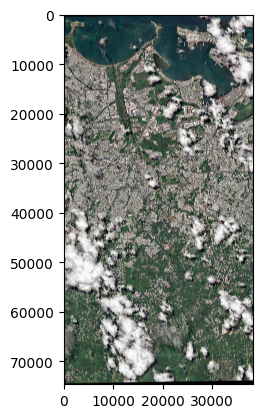

In [4]:
with rasterio.open('Pre_Event_San_Juan.tif') as src:
    red = src.read(1)
    green = src.read(2)
    blue = src.read(3)

img = np.dstack((red, green, blue))

plt.imshow(img)
plt.show()

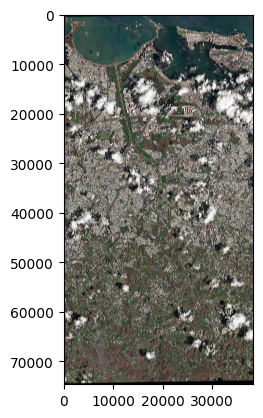

In [4]:
with rasterio.open('Post_Event_San_Juan.tif') as src:
    red = src.read(1)
    green = src.read(2)
    blue = src.read(3)

img = np.dstack((red, green, blue))

plt.imshow(img)
plt.show()

In [2]:
pre_event_image='Pre_Event_San_Juan.tif'
post_event_image='Post_Event_San_Juan.tif'

In [3]:
# Open the geotiff file
def load_and_visualize(image_path):
    with rasterio.open(image_path) as src:
        # read the red, green and blue bands
        red = src.read(1)
        green = src.read(2)
        blue = src.read(3)
    # Plot the bands
    fig, (ax1, ax2, ax3) = plt.subplots(1, 3, figsize=(20, 5))
    ax1.imshow(red,cmap='Reds')
    ax1.set_title('Red Band')
    ax2.imshow(green, cmap='Greens')
    ax2.set_title('Green Band')
    ax3.imshow(blue, cmap='Blues')
    ax3.set_title('Blue Band')
plt.show()

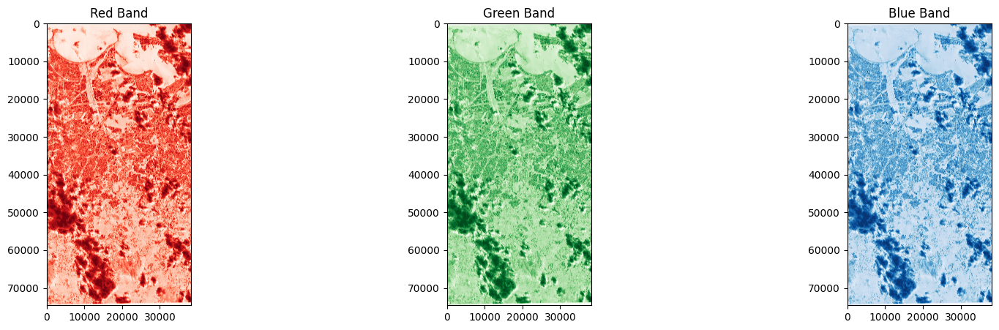

In [4]:
load_and_visualize(pre_event_image)

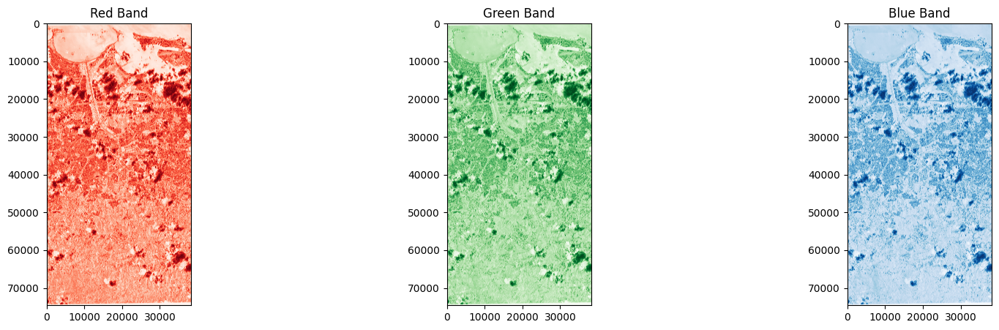

In [5]:
load_and_visualize(post_event_image)

The photographs depict the aftermath of disaster Maria in Puerto Rico, where both residential and commercial buildings sustained damage.

Pre-Event Image: A satellite image that was captured before to Hurricane Maria hitting Puerto Rico is loaded in the initial call to load_and_visualize with pre_event_image. The distribution of local characteristics, including roads, vegetation, residential and commercial buildings, and other infrastructure, is depicted in this image's RGB bands.

Post-Event Image: A satellite image obtained following Hurricane Maria's devastation of Puerto Rico is loaded by the second call to load_and_visualize with post_event_image. The level of destruction to residential and commercial buildings, as well as the changes in the environment brought about by the hurricane, are captured in the RGB bands of this photograph.

You can examine the alterations in the built environment, with a special emphasis on the harm Hurricane Maria inflicted to residential and commercial structures, by contrasting the photographs taken before and after the disaster. Urban planning, infrastructure resilience initiatives, and disaster response and recovery activities can all benefit from the insights this study can offer.

To put it briefly, removing RGB bands from satellite photos aids in:
Visual Interpretation: Produce color pictures that make it simple for people to understand characteristics like vegetation, buildings, and water features.
Using their spectral signatures, distinguish and identify various features on the surface of the Earth.
Change Detection: Use RGB image comparison to identify changes over time, supporting analyses of land cover change, disaster assessment, etc.
Quantitative Analysis: For scientific study and decision-making, use pixel values to calculate various metrics like vegetation indices, water quality factors, and land surface temperature.

In [4]:
input_file = r"C:\Users\ronit\OneDrive\Documents\GitHub\structural-damage-assessment\Post_Event_San_Juan.tif"
with rasterio.open(input_file) as src:
    print(src.shape)

(74602, 38259)


In [4]:
def generate_tiles(input_file, output_dir, grid_x, grid_y):
    with rasterio.open(input_file) as src:
        height, width = src.shape  # Swap width and height
        num_bands = src.count

        num_tiles_x = height // grid_x  # Swap height and width
        num_tiles_y = width // grid_y  # Swap height and width

        print(f"Total number of tiles: {num_tiles_x * num_tiles_y}")

        os.makedirs(output_dir, exist_ok=True)

        for i in range(num_tiles_x):
            for j in range(num_tiles_y):    
                y_offset = i * grid_x  # Swap y_offset and x_offset
                x_offset = j * grid_y  # Swap y_offset and x_offset

                window = Window(x_offset, y_offset, grid_x, grid_y)
                
                # Print window coordinates
                print(f"Window coordinates for tile_{i}_{j}: col_off={window.col_off}, row_off={window.row_off}, width={window.width}, height={window.height}")

                # Read the data from the window
                tile = src.read(window=window)

                output_file = os.path.join(output_dir, f"tile_{i}_{j}.tif")

                with rasterio.open(output_file, 'w', driver='GTiff',
                                   height=grid_y, width=grid_x,
                                   count=num_bands, dtype=tile.dtype,
                                   crs=src.crs, transform=src.window_transform(window)) as dst:
                    dst.write(tile)

        print("Tiles generation completed.")

In [5]:
input_file = r"I:\EY_Storm\Post_Event_San_Juan.tif"
output_dir = r"I:\EY_Storm\images"
grid_x = 512
grid_y = 512
generate_tiles(input_file, output_dir, grid_x, grid_y)

Total number of tiles: 10730
Window coordinates for tile_0_0: col_off=0, row_off=0, width=512, height=512
Window coordinates for tile_0_1: col_off=512, row_off=0, width=512, height=512
Window coordinates for tile_0_2: col_off=1024, row_off=0, width=512, height=512
Window coordinates for tile_0_3: col_off=1536, row_off=0, width=512, height=512
Window coordinates for tile_0_4: col_off=2048, row_off=0, width=512, height=512
Window coordinates for tile_0_5: col_off=2560, row_off=0, width=512, height=512
Window coordinates for tile_0_6: col_off=3072, row_off=0, width=512, height=512
Window coordinates for tile_0_7: col_off=3584, row_off=0, width=512, height=512
Window coordinates for tile_0_8: col_off=4096, row_off=0, width=512, height=512
Window coordinates for tile_0_9: col_off=4608, row_off=0, width=512, height=512
Window coordinates for tile_0_10: col_off=5120, row_off=0, width=512, height=512
Window coordinates for tile_0_11: col_off=5632, row_off=0, width=512, height=512
Window coordi

In [5]:
def convert_tiff_to_jpeg(input_dir,output_dir):
    # check if output_dir exists, if not create it
    if not os.path.exists(output_dir):
        os.makedirs(output_dir)

    for filename in os.listdir(input_dir):
        # check if file is an image (ends with .tif)
        if filename.endswith('.tif'):
            img = Image.open(os.path.join(input_dir, filename))
        
            # check if image is RGB mode, if not convert it
            if img.mode != 'RGB':
                img = img.convert('RGB')
        
            # create new filename, replace .tif with .jpg
            output_filename = os.path.splitext(filename)[0] + '.jpg'
        
            # save the image in JPEG format
            img.save(os.path.join(output_dir, output_filename), 'JPEG')
    print("Conversion from TIFF to JPEG completed.")

In [7]:
input_dir = r"I:\EY_Storm\post_images"
output_dir = r"I:\EY_Storm\new_images"
convert_tiff_to_jpeg(input_dir,output_dir)

Conversion from TIFF to JPEG completed.


In [6]:
def rename_files(directory_path):
# Define the directory path where your files are located
    directory_path = directory_path
    
    # Get a list of all files in the directory
    files = os.listdir(directory_path)
    
    # Define a prefix for the new file names 
    # Change the prefix as per requirement
    prefix = "Post_Event_"
    
    # Start the numbering from 1
    number = 0
    
    # Loop through each file in the directory
    for filename in files:
        # Check if the item is a file (not a directory)
        if os.path.isfile(os.path.join(directory_path, filename)):
            # Get the file extension
            file_extension = os.path.splitext(filename)[1]
    
            # Create the new file name with leading zeros
            new_filename = f"{prefix}{number:03}{file_extension}"
    
            # Construct the full path to the original and new files
            old_filepath = os.path.join(directory_path, filename)
            new_filepath = os.path.join(directory_path, new_filename)
    
            # Rename the file
            os.rename(old_filepath, new_filepath)
    
            # Increment the number for the next file
            number += 1
    
    print("Files renamed successfully.")

In [9]:
rename_files(output_dir)

Files renamed successfully.


In [ ]:
def detect_corners(img, method="HARRIS"):
    himg = img.copy()
    gray_img = np.float32(cv2.cvtColor(img, cv2.COLOR_BGR2GRAY))     
    # Harris corner detector
    if method == "HARRIS":
        corners = cv2.cornerHarris(gray_img, blockSize=2, ksize=3, k=0.04)
        corners = cv2.dilate(corners, None)
        corners = np.intp(corners)
        himg[corners > 0.01 * corners.max()]=[0, 0, 255] 
    # Shi-Tomasi corner detector
    elif method == "SHITOMASI":
        corners = cv2.goodFeaturesToTrack(gray_img, maxCorners=30, qualityLevel=0.01, minDistance=10)#.reshape((-1, 2))
        corners = np.intp(corners)
        for i in corners:
            x,y = i.ravel()
            cv2.circle(himg,(x,y),3,(0,0,255),-1)
    plt.imshow(himg)
    plt.show()    
    return corners

In [7]:
!labelme2yolo --json_dir "C:\Users\ronit\EY_Storm\only_json"

INFO:labelme2yolo:Converting train set ...

100%|██████████| 214/214 [00:19<00:00, 10.87it/s]
INFO:labelme2yolo:Converting val set ...

100%|██████████| 53/53 [00:04<00:00, 11.04it/s]
INFO:labelme2yolo:Converting test set ...

0it [00:00, ?it/s]
0it [00:00, ?it/s]


In [8]:
#Loading the model
model = YOLO('yolov8n.pt')
# Display model information (optional)
model.info()

YOLOv8n summary: 225 layers, 3157200 parameters, 0 gradients, 8.9 GFLOPs


(225, 3157200, 0, 8.8575488)

In [9]:
# Train the model on the dataset for 50 epochs
results = model.train(data=r"C:\Users\ronit\EY_Storm\only_json\YOLODataset\dataset.yaml", epochs=50, imgsz=512)

New https://pypi.org/project/ultralytics/8.1.26 available 😃 Update with 'pip install -U ultralytics'
Ultralytics YOLOv8.1.11 🚀 Python-3.11.4 torch-2.2.0+cpu CPU (12th Gen Intel Core(TM) i9-12900H)
engine\trainer: task=detect, mode=train, model=yolov8n.pt, data=C:\Users\ronit\EY_Storm\only_json\YOLODataset\dataset.yaml, epochs=50, time=None, patience=50, batch=16, imgsz=512, save=True, save_period=-1, cache=False, device=None, workers=8, project=None, name=train, exist_ok=False, pretrained=True, optimizer=auto, verbose=True, seed=0, deterministic=True, single_cls=False, rect=False, cos_lr=False, close_mosaic=10, resume=False, amp=True, fraction=1.0, profile=False, freeze=None, multi_scale=False, overlap_mask=True, mask_ratio=4, dropout=0.0, val=True, split=val, save_json=False, save_hybrid=False, conf=None, iou=0.7, max_det=300, half=False, dnn=False, plots=True, source=None, vid_stride=1, stream_buffer=False, visualize=False, augment=False, agnostic_nms=False, classes=None, retina_mask

train: Scanning C:\Users\ronit\EY_Storm\only_json\YOLODataset\datasets\train... 214 images, 0 backgrounds, 0 corrupt: 100%|██████████| 214/214 [00:00<00:00, 1406.09it/s]

train: New cache created: C:\Users\ronit\EY_Storm\only_json\YOLODataset\datasets\train.cache



val: Scanning C:\Users\ronit\EY_Storm\only_json\YOLODataset\datasets\val... 53 images, 0 backgrounds, 0 corrupt: 100%|██████████| 53/53 [00:00<00:00, 1484.09it/s]

val: New cache created: C:\Users\ronit\EY_Storm\only_json\YOLODataset\datasets\val.cache


Plotting labels to runs\detect\train\labels.jpg... 
optimizer: 'optimizer=auto' found, ignoring 'lr0=0.01' and 'momentum=0.937' and determining best 'optimizer', 'lr0' and 'momentum' automatically... 
optimizer: AdamW(lr=0.00125, momentum=0.9) with parameter groups 57 weight(decay=0.0), 64 weight(decay=0.0005), 63 bias(decay=0.0)
TensorBoard: model graph visualization added ✅
Image sizes 512 train, 512 val
Using 0 dataloader workers
Logging results to runs\detect\train
Starting training for 50 epochs...

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       1/50         0G      1.772      3.956      1.511        109        512: 100%|██████████| 14/14 [01:12<00:00,  5.19s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:07<00:00,  3.61s/it]

                   all         53        834    0.00478      0.143    0.00664    0.00179



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       2/50         0G      1.547      2.771      1.261        107        512: 100%|██████████| 14/14 [01:24<00:00,  6.07s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:06<00:00,  3.17s/it]

                   all         53        834     0.0316      0.445      0.158     0.0679



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       3/50         0G      1.525      2.245      1.234         48        512: 100%|██████████| 14/14 [01:18<00:00,  5.59s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:02<00:00,  1.39s/it]

                   all         53        834     0.0303      0.409      0.137     0.0646

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size



       4/50         0G      1.473      2.029      1.213        132        512: 100%|██████████| 14/14 [00:53<00:00,  3.81s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:06<00:00,  3.31s/it]

                   all         53        834      0.448      0.272      0.193     0.0972



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       5/50         0G      1.479      1.802      1.199        123        512: 100%|██████████| 14/14 [01:19<00:00,  5.65s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:07<00:00,  3.63s/it]

                   all         53        834      0.199      0.289      0.204      0.099



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       6/50         0G      1.449      1.758      1.198        128        512: 100%|██████████| 14/14 [01:22<00:00,  5.90s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:07<00:00,  3.51s/it]

                   all         53        834      0.223       0.36      0.229      0.123



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       7/50         0G       1.44      1.688      1.199        166        512: 100%|██████████| 14/14 [01:03<00:00,  4.54s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:04<00:00,  2.19s/it]

                   all         53        834      0.195      0.416      0.257      0.145



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       8/50         0G      1.444      1.678        1.2         95        512: 100%|██████████| 14/14 [00:47<00:00,  3.39s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:02<00:00,  1.47s/it]

                   all         53        834      0.205      0.488      0.273      0.146



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       9/50         0G      1.434       1.63      1.185        134        512: 100%|██████████| 14/14 [00:23<00:00,  1.68s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:02<00:00,  1.40s/it]

                   all         53        834       0.21      0.339      0.256      0.141

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size



      10/50         0G      1.412      1.616      1.201        115        512: 100%|██████████| 14/14 [00:23<00:00,  1.67s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:02<00:00,  1.40s/it]

                   all         53        834       0.48      0.294      0.227      0.122

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size



      11/50         0G      1.388      1.561      1.191         82        512: 100%|██████████| 14/14 [00:23<00:00,  1.69s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:02<00:00,  1.44s/it]

                   all         53        834       0.45      0.366      0.264      0.141

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size



      12/50         0G      1.377      1.582        1.2         76        512: 100%|██████████| 14/14 [00:24<00:00,  1.71s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:02<00:00,  1.43s/it]

                   all         53        834      0.181      0.441      0.259      0.148



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      13/50         0G      1.352      1.443      1.153        114        512: 100%|██████████| 14/14 [00:23<00:00,  1.69s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:02<00:00,  1.44s/it]

                   all         53        834      0.206       0.31      0.269      0.157



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      14/50         0G      1.342      1.484      1.154        117        512: 100%|██████████| 14/14 [00:23<00:00,  1.70s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:03<00:00,  1.57s/it]

                   all         53        834      0.487      0.295      0.287      0.169



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      15/50         0G      1.321      1.474      1.142        101        512: 100%|██████████| 14/14 [00:23<00:00,  1.68s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:02<00:00,  1.48s/it]

                   all         53        834       0.24      0.388      0.289       0.17



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      16/50         0G      1.323      1.495       1.16         84        512: 100%|██████████| 14/14 [00:23<00:00,  1.67s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:02<00:00,  1.44s/it]

                   all         53        834      0.213      0.436      0.312      0.181

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size



      17/50         0G      1.352      1.436      1.158        123        512: 100%|██████████| 14/14 [00:23<00:00,  1.66s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:02<00:00,  1.46s/it]

                   all         53        834      0.474      0.441      0.292      0.172

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size



      18/50         0G      1.299      1.432      1.141        112        512: 100%|██████████| 14/14 [00:23<00:00,  1.67s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:02<00:00,  1.46s/it]

                   all         53        834      0.445      0.446       0.27      0.157

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size



      19/50         0G      1.318      1.439      1.167         92        512: 100%|██████████| 14/14 [00:23<00:00,  1.66s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:02<00:00,  1.44s/it]

                   all         53        834      0.717      0.299      0.268       0.16

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size



      20/50         0G      1.301      1.446      1.154         56        512: 100%|██████████| 14/14 [00:23<00:00,  1.66s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:02<00:00,  1.48s/it]

                   all         53        834      0.506      0.406      0.305      0.178

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size



      21/50         0G      1.281      1.398      1.117        154        512: 100%|██████████| 14/14 [00:23<00:00,  1.69s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:02<00:00,  1.48s/it]

                   all         53        834      0.464      0.463      0.304      0.176

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size



      22/50         0G      1.311      1.411      1.138        104        512: 100%|██████████| 14/14 [00:23<00:00,  1.68s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:02<00:00,  1.45s/it]

                   all         53        834      0.189      0.454      0.272      0.153

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size



      23/50         0G      1.283      1.346      1.131        112        512: 100%|██████████| 14/14 [00:23<00:00,  1.67s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:02<00:00,  1.42s/it]

                   all         53        834      0.497      0.381      0.285      0.173

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size



      24/50         0G      1.305      1.407      1.154        174        512: 100%|██████████| 14/14 [00:23<00:00,  1.67s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:02<00:00,  1.44s/it]

                   all         53        834      0.525      0.398       0.32      0.193



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      25/50         0G      1.273       1.34      1.128        148        512: 100%|██████████| 14/14 [00:23<00:00,  1.67s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:02<00:00,  1.45s/it]

                   all         53        834      0.549      0.389      0.332      0.196



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      26/50         0G      1.264      1.297      1.117         57        512: 100%|██████████| 14/14 [00:23<00:00,  1.68s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:02<00:00,  1.44s/it]

                   all         53        834      0.553       0.36      0.317      0.189

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size



      27/50         0G      1.272      1.326      1.122         60        512: 100%|██████████| 14/14 [00:23<00:00,  1.67s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:02<00:00,  1.42s/it]

                   all         53        834      0.623      0.366      0.327      0.187

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size



      28/50         0G      1.276      1.249       1.12        136        512: 100%|██████████| 14/14 [00:23<00:00,  1.69s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:02<00:00,  1.39s/it]

                   all         53        834      0.607      0.303      0.319      0.188

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size



      29/50         0G      1.249      1.282      1.106        169        512: 100%|██████████| 14/14 [00:23<00:00,  1.69s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:02<00:00,  1.41s/it]

                   all         53        834      0.226      0.401      0.295      0.176

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size



      30/50         0G      1.278      1.313      1.128         73        512: 100%|██████████| 14/14 [00:23<00:00,  1.68s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:02<00:00,  1.42s/it]

                   all         53        834      0.511      0.454       0.36      0.225



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      31/50         0G      1.264      1.312      1.125        159        512: 100%|██████████| 14/14 [00:23<00:00,  1.67s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:02<00:00,  1.41s/it]

                   all         53        834      0.496      0.418      0.375      0.236



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      32/50         0G      1.248      1.221      1.103         95        512: 100%|██████████| 14/14 [00:23<00:00,  1.70s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:02<00:00,  1.43s/it]

                   all         53        834      0.376      0.459      0.348      0.213

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size



      33/50         0G      1.248      1.208      1.116        134        512: 100%|██████████| 14/14 [00:23<00:00,  1.67s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:02<00:00,  1.43s/it]

                   all         53        834      0.372      0.502      0.372      0.223

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size



      34/50         0G      1.255       1.25      1.117        134        512: 100%|██████████| 14/14 [00:23<00:00,  1.66s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:02<00:00,  1.41s/it]

                   all         53        834      0.322      0.474      0.361      0.224

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size



      35/50         0G      1.224      1.257      1.099        115        512: 100%|██████████| 14/14 [00:23<00:00,  1.66s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:02<00:00,  1.40s/it]

                   all         53        834      0.396      0.456      0.386      0.242



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      36/50         0G       1.22      1.243      1.105         66        512: 100%|██████████| 14/14 [00:23<00:00,  1.67s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:02<00:00,  1.39s/it]

                   all         53        834      0.306      0.423      0.351      0.215

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size



      37/50         0G      1.215      1.233      1.106         96        512: 100%|██████████| 14/14 [00:23<00:00,  1.66s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:02<00:00,  1.43s/it]

                   all         53        834      0.576      0.386      0.339      0.208

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size



      38/50         0G      1.232        1.2      1.093        148        512: 100%|██████████| 14/14 [00:23<00:00,  1.67s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:02<00:00,  1.43s/it]

                   all         53        834      0.554      0.395      0.344      0.211

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size



      39/50         0G      1.199      1.152      1.086        167        512: 100%|██████████| 14/14 [00:23<00:00,  1.68s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:02<00:00,  1.40s/it]

                   all         53        834      0.563      0.359      0.336      0.207



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      40/50         0G      1.219      1.176      1.073        199        512: 100%|██████████| 14/14 [00:23<00:00,  1.69s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:02<00:00,  1.38s/it]

                   all         53        834      0.603      0.333      0.331        0.2
Closing dataloader mosaic

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size



      41/50         0G      1.175      1.244      1.102         97        512: 100%|██████████| 14/14 [00:23<00:00,  1.67s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:05<00:00,  2.96s/it]

                   all         53        834      0.253      0.452      0.313      0.185



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      42/50         0G      1.169      1.209      1.103         87        512: 100%|██████████| 14/14 [01:01<00:00,  4.36s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:06<00:00,  3.27s/it]

                   all         53        834      0.255      0.449      0.328        0.2

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size



      43/50         0G      1.176      1.185        1.1         95        512: 100%|██████████| 14/14 [00:34<00:00,  2.43s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:08<00:00,  4.39s/it]

                   all         53        834      0.525      0.456      0.358      0.221



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      44/50         0G      1.155      1.133       1.09         88        512: 100%|██████████| 14/14 [01:15<00:00,  5.39s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:08<00:00,  4.26s/it]

                   all         53        834      0.389      0.497      0.381      0.237



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      45/50         0G      1.138      1.121      1.082         91        512: 100%|██████████| 14/14 [00:47<00:00,  3.40s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:02<00:00,  1.39s/it]

                   all         53        834      0.261      0.473       0.37      0.231

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size



      46/50         0G      1.166      1.088      1.083         54        512: 100%|██████████| 14/14 [00:22<00:00,  1.59s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:02<00:00,  1.43s/it]

                   all         53        834      0.375      0.498      0.376      0.238

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size



      47/50         0G       1.13        1.1      1.082        100        512: 100%|██████████| 14/14 [00:22<00:00,  1.60s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:02<00:00,  1.39s/it]

                   all         53        834      0.595      0.378      0.366      0.231

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size



      48/50         0G      1.135      1.047      1.073         70        512: 100%|██████████| 14/14 [00:23<00:00,  1.65s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:02<00:00,  1.42s/it]

                   all         53        834       0.64      0.344      0.363      0.226

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size



      49/50         0G      1.116      1.038      1.069         41        512: 100%|██████████| 14/14 [00:21<00:00,  1.57s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:02<00:00,  1.37s/it]

                   all         53        834      0.256      0.459      0.358      0.223

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size



      50/50         0G      1.124       1.05      1.073         59        512: 100%|██████████| 14/14 [00:21<00:00,  1.57s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:02<00:00,  1.37s/it]

                   all         53        834      0.295      0.516      0.357      0.223

50 epochs completed in 0.518 hours.


Optimizer stripped from runs\detect\train\weights\last.pt, 6.2MB
Optimizer stripped from runs\detect\train\weights\best.pt, 6.2MB

Validating runs\detect\train\weights\best.pt...
Ultralytics YOLOv8.1.11 🚀 Python-3.11.4 torch-2.2.0+cpu CPU (12th Gen Intel Core(TM) i9-12900H)
Model summary (fused): 168 layers, 3006428 parameters, 0 gradients, 8.1 GFLOPs


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:02<00:00,  1.26s/it]


                   all         53        834      0.393      0.456      0.386      0.242
undamagedresidentialbuilding         53         38      0.285      0.342      0.325       0.22
damagedresidentialbuilding         53        653      0.509      0.926      0.758      0.445
damagedcommercialbuilding         53          6      0.418      0.167      0.174      0.152
undamagedcommercialbuilding         53        137      0.361      0.387      0.285      0.151
Speed: 0.5ms preprocess, 29.5ms inference, 0.0ms loss, 3.5ms postprocess per image
Results saved to runs\detect\train


Overall Performance
Precision (Box P): Average precision across all classes is 0.393, indicating that approximately 39.3% of the model's predictions were correct.
Recall (R): The average recall is 0.456, suggesting the model correctly identified 45.6% of all relevant objects across classes.
mAP50: The mean Average Precision at an Intersection over Union (IoU) threshold of 0.5 is 0.386, showing the model's overall detection accuracy at a moderate IoU threshold.
mAP50-95: The mAP calculated over IoU thresholds from 0.5 to 0.95 is 0.242, which indicates the model's performance across a range of stricter criteria for matching predictions to ground truth.
Performance by Class
Undamaged Residential Building: Lower precision (0.285) and recall (0.342) than some other categories, with an mAP50 of 0.325. This suggests challenges in accurately identifying undamaged residential buildings.
Damaged Residential Building: Shows significantly better results, especially in recall (0.926), indicating a high ability to detect damaged residential buildings. However, precision is moderate (0.509), suggesting some false positives.
Damaged Commercial Building: Has low precision (0.418) and very low recall (0.167), with an mAP50 of 0.174, indicating the model struggles considerably with this category.
Undamaged Commercial Building: Similar to damaged commercial buildings, this category has low metrics across the board, indicating difficulty in detecting undamaged commercial buildings accurately.

A good model will show decreasing loss and increasing precision, recall, and mAP values over epochs, with the validation metrics following closely behind the training metrics. Gaps between training and validation metrics indicate issues like overfitting, which might require adjustments to the model architecture, data, or training process.The key takeaways from model's performance plots—like the loss, precision, recall, and mean Average Precision (mAP) are very imortant.
Loss: Should decrease steadily over time for both training and validation. A stable or increasing validation loss while training loss decreases may indicate overfitting
Precision and Recall: Both should ideally increase over time. Precision indicates the reliability of your model’s predictions, while recall shows its ability to detect all possible positives. A balance between these two metrics is essential
mAP: Increasing mAP values signal overall model improvement, capturing both the precision and recall in a single metric. This is often considered to be the most comprehensive indicator of a model's performance

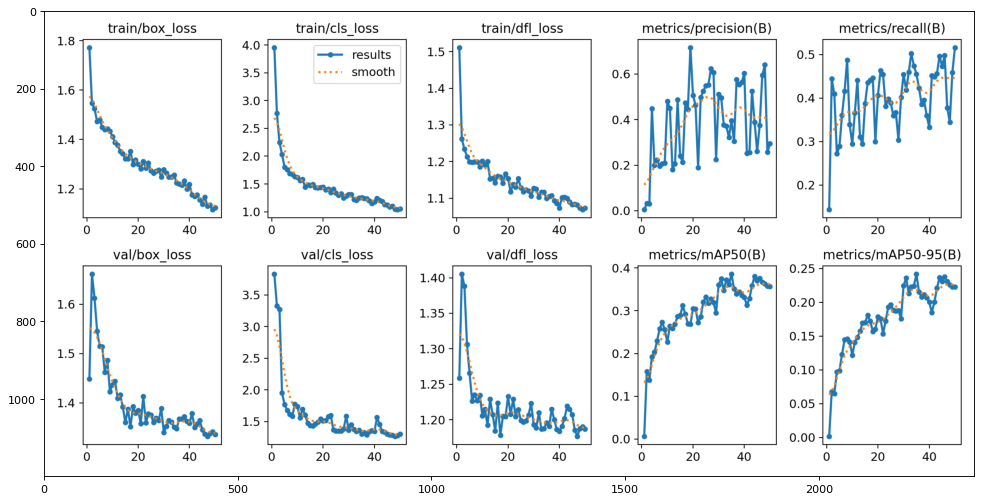

In [10]:
figure(figsize=(15, 10), dpi=80)
# reading the image 
results = img.imread('runs/detect/train/results.png')   
# displaying the image 
plt.imshow(results) 

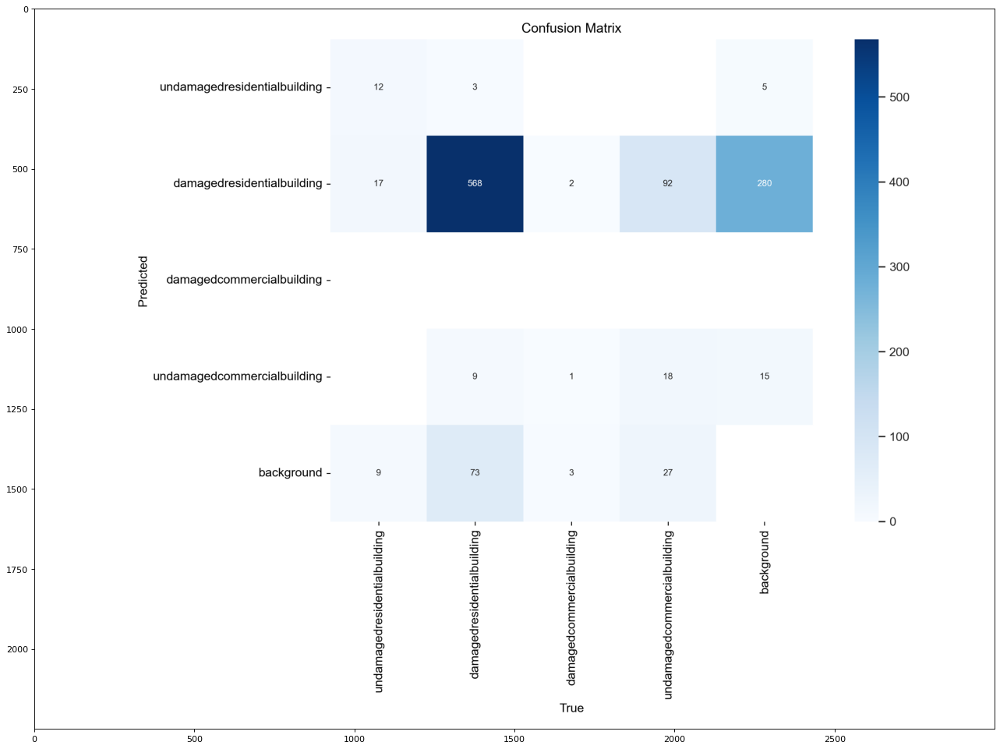

In [11]:
figure(figsize=(20,15), dpi=80)  
# reading the image 
cf = img.imread('runs/detect/train/confusion_matrix.png') 
# displaying the image 
plt.imshow(cf) 

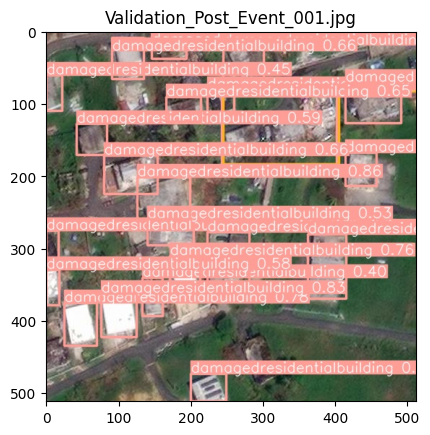

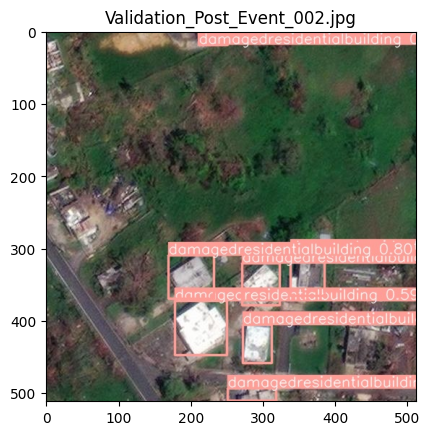

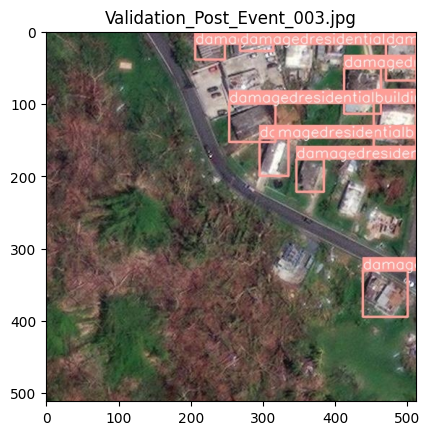

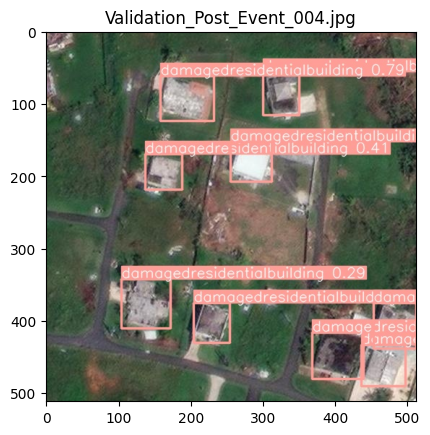

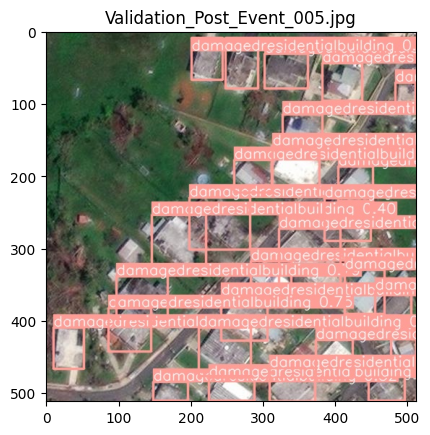

...

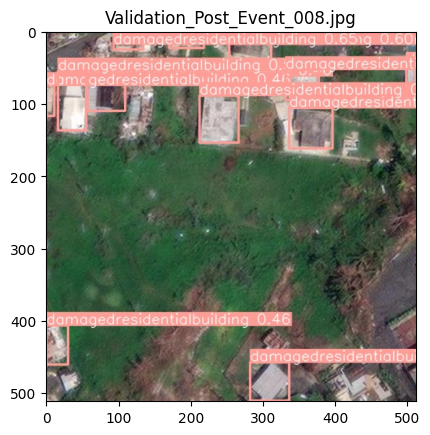

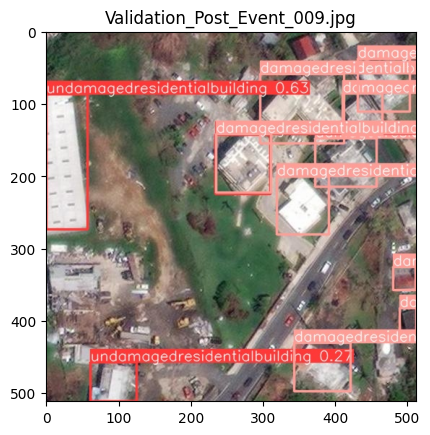

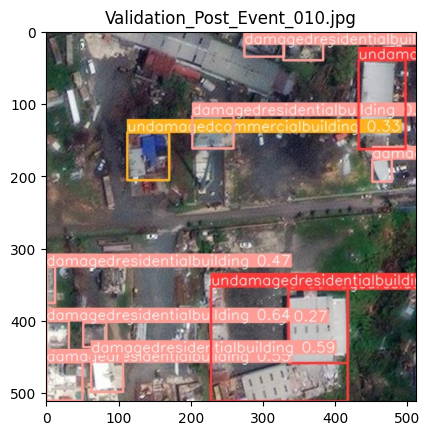

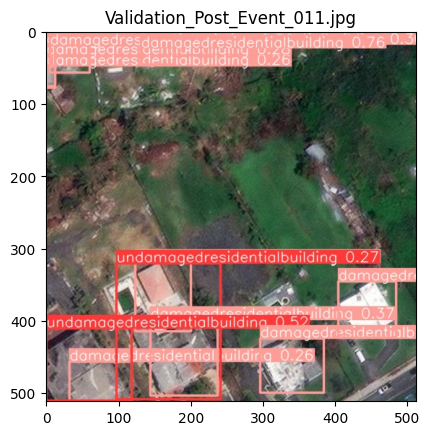

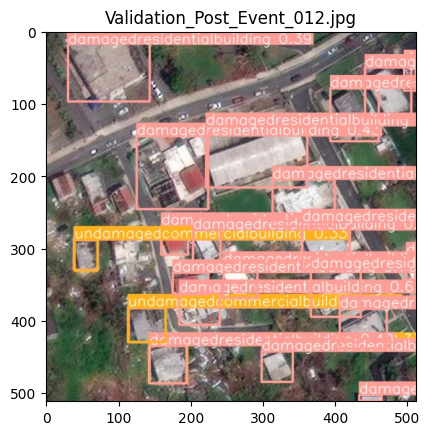

In [17]:
import os
import numpy as np
import matplotlib.pyplot as plt
import rasterio

# Path to the folder containing the images
folder_path = r'C:\Users\ronit\OneDrive\Documents\GitHub\structural-damage-assessment\runs\detect\predict'

# List all files in the folder
image_files = [f for f in os.listdir(folder_path) if f.endswith(('jpg', 'jpeg', 'png', 'tif', 'tiff'))]

# Loop through each image file
for image_file in image_files:
    try:
        # Open the image file using rasterio
        with rasterio.open(os.path.join(folder_path, image_file)) as src:
            red = src.read(1)
            green = src.read(2)
            blue = src.read(3)

        # Combine bands into an RGB image
        img = np.dstack((red, green, blue))

        # Display the image
        plt.imshow(img)
        plt.title(image_file)  # Set title as image file name
        plt.show()
    except Exception as e:
        print(f"Error processing {image_file}: {e}")


In [13]:
def unzip_folder(zip_filepath, dest_dir):
    with zipfile.ZipFile(zip_filepath, 'r') as zip_ref:
        zip_ref.extractall(dest_dir)
    print(f'The zip file {zip_filepath} has been extracted to the directory {dest_dir}')



submission_zip = r"C:\Users\ronit\EY_Storm\challenge_1_submission_images.zip"
submission_directory = r'C:\Users\ronit\EY_Storm\challenge_1_submission_images'
unzip_folder(submission_zip,submission_directory)

The zip file C:\Users\ronit\EY_Storm\challenge_1_submission_images.zip has been extracted to the directory C:\Users\ronit\EY_Storm\challenge_1_submission_images


In [12]:
model = YOLO(r'C:\Users\ronit\EY_Storm\runs\detect\train\weights\best.pt')

In [13]:
# Update the directory paths
directory = r'C:\Users\ronit\EY_Storm\challenge_1_submission_images\Submission data'
results_directory = r'C:\Users\ronit\EY_Storm\Validation_Data_Results'

# Update the decoding of predictions dictionary
decoding_of_predictions = {0: 'undamagedresidentialbuilding', 1: 'damagedresidentialbuilding', 2: 'damagedcommercialbuilding', 3: 'undamagedcommercialbuilding'}

# Create submission directory if it doesn't exist
if not os.path.exists(results_directory):
    os.makedirs(results_directory)

# Loop through each file in the directory
for filename in os.listdir(directory):
    # Check if the current object is a file and ends with .jpeg
    if os.path.isfile(os.path.join(directory, filename)) and filename.lower().endswith('.jpg'):
        # Perform operations on the file
        file_path = os.path.join(directory, filename)
        print(file_path)
        print("Making a prediction on ", filename)
        results = model.predict(file_path, save=True, iou=0.5, save_txt=True, conf=0.25)
        
        for r in results:
            conf_list = r.boxes.conf.numpy().tolist()
            clss_list = r.boxes.cls.numpy().tolist()
            original_list = clss_list
            updated_list = []
            for element in original_list:
                updated_list.append(decoding_of_predictions[int(element)])

        bounding_boxes = r.boxes.xyxy.numpy()
        confidences = conf_list
        class_names = updated_list

        # Check if bounding boxes, confidences and class names match
        if len(bounding_boxes) != len(confidences) or len(bounding_boxes) != len(class_names):
            print("Error: Number of bounding boxes, confidences, and class names should be the same.")
            continue
        text_file_name = os.path.splitext(filename)[0]
        # Creating a new .txt file for each image in the submission_directory
        with open(os.path.join(results_directory, f"{text_file_name}.txt"), "w") as file:
            for i in range(len(bounding_boxes)):
                # Get coordinates of each bounding box
                left, top, right, bottom = bounding_boxes[i]
                # Write content to file in desired format
                file.write(f"{class_names[i]} {confidences[i]} {left} {top} {right} {bottom}\n")
        print("Output files generated successfully.")


C:\Users\ronit\EY_Storm\challenge_1_submission_images\Submission data\Validation_Post_Event_001.jpg
Making a prediction on  Validation_Post_Event_001.jpg

image 1/1 C:\Users\ronit\EY_Storm\challenge_1_submission_images\Submission data\Validation_Post_Event_001.jpg: 512x512 22 damagedresidentialbuildings, 1 undamagedcommercialbuilding, 65.4ms
Speed: 1.5ms preprocess, 65.4ms inference, 4.5ms postprocess per image at shape (1, 3, 512, 512)
Results saved to runs\detect\predict
1 label saved to runs\detect\predict\labels
Output files generated successfully.
C:\Users\ronit\EY_Storm\challenge_1_submission_images\Submission data\Validation_Post_Event_002.jpg
Making a prediction on  Validation_Post_Event_002.jpg

image 1/1 C:\Users\ronit\EY_Storm\challenge_1_submission_images\Submission data\Validation_Post_Event_002.jpg: 512x512 7 damagedresidentialbuildings, 52.0ms
Speed: 1.5ms preprocess, 52.0ms inference, 8.0ms postprocess per image at shape (1, 3, 512, 512)
Results saved to runs\detect\pre

In [14]:
# # Define your source directory and the destination where the zip file will be created
# source_dir = results_directory
# destination_zip = 'submission'

# # Create a zip file from the directory
# shutil.make_archive(destination_zip, 'zip', source_dir)

# print(f"Directory {source_dir} has been successfully zipped into {destination_zip}.")

Directory C:\Users\ronit\EY_Storm\Validation_Data_Results has been successfully zipped into submission.


In [9]:
# Path to the directory containing the original images
input_dir = r'C:\Users\ronit\OneDrive\Documents\GitHub\structural-damage-assessment\before_enhance'

# Path to the directory where enhanced images will be saved
output_dir = r'C:\Users\ronit\OneDrive\Documents\GitHub\structural-damage-assessment\after_enhance'

# Function to perform contrast enhancement
def enhance_contrast(image):
    # Convert image to LAB color space
    lab = cv2.cvtColor(image, cv2.COLOR_BGR2LAB)
    
    # Split the LAB image into L, A, and B channels
    l, a, b = cv2.split(lab)
    
    # Apply CLAHE (Contrast Limited Adaptive Histogram Equalization) to the L channel
    clahe = cv2.createCLAHE(clipLimit=3.0, tileGridSize=(8, 8))
    enhanced_l = clahe.apply(l)
    
    # Merge the enhanced L channel with the original A and B channels
    enhanced_lab = cv2.merge((enhanced_l, a, b))
    
    # Convert LAB image back to RGB color space
    enhanced_image = cv2.cvtColor(enhanced_lab, cv2.COLOR_LAB2BGR)
    
    return enhanced_image

# Function to perform sharpness enhancement
def enhance_sharpness(image):
    # Apply Gaussian blur to the image
    blurred = cv2.GaussianBlur(image, (0, 0), 3)
    
    # Apply unsharp masking to enhance sharpness
    sharpened = cv2.addWeighted(image, 1.5, blurred, -0.5, 0)
    
    return sharpened

# Function to perform histogram equalization
def enhance_histogram(image):
    # Convert image to grayscale
    gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
    
    # Apply histogram equalization
    equalized = cv2.equalizeHist(gray)
    
    # Convert grayscale image back to BGR color space
    equalized_image = cv2.cvtColor(equalized, cv2.COLOR_GRAY2BGR)
    
    return equalized_image

# Iterate over each image in the input directory
for filename in os.listdir(input_dir):
    # Check if the file is an image
    if filename.endswith('.jpg') or filename.endswith('.jpeg') or filename.endswith('.png'):
        # Read the image
        image = cv2.imread(os.path.join(input_dir, filename))
        
        # Perform contrast enhancement
        contrast_enhanced = enhance_contrast(image)
        
        # Perform sharpness enhancement
        sharpness_enhanced = enhance_sharpness(contrast_enhanced)
        
        # Perform histogram equalization
        histogram_equalized = enhance_histogram(sharpness_enhanced)
        
        # Save the enhanced image
        output_path = os.path.join(output_dir, filename)
        cv2.imwrite(output_path, histogram_equalized)

print("Enhancement completed.")


Enhancement completed.


In [8]:
model = YOLO(r'C:\Users\ronit\OneDrive\Documents\GitHub\structural-damage-assessment\runs\detect\train\weights\best.pt')

In [9]:
# Update the directory paths
directory = r'C:\Users\ronit\OneDrive\Documents\GitHub\structural-damage-assessment\after_enhance_train'
results_directory = r'C:\Users\ronit\OneDrive\Documents\GitHub\structural-damage-assessment\after_enhance_results'

# Update the decoding of predictions dictionary
decoding_of_predictions = {0: 'undamagedresidentialbuilding', 1: 'damagedresidentialbuilding', 2: 'damagedcommercialbuilding', 3: 'undamagedcommercialbuilding'}

# Create submission directory if it doesn't exist
if not os.path.exists(results_directory):
    os.makedirs(results_directory)

# Loop through each file in the directory
for filename in os.listdir(directory):
    # Check if the current object is a file and ends with .jpeg
    if os.path.isfile(os.path.join(directory, filename)) and filename.lower().endswith('.jpg'):
        # Perform operations on the file
        file_path = os.path.join(directory, filename)
        print(file_path)
        print("Making a prediction on ", filename)
        results = model.predict(file_path, save=True, iou=0.5, save_txt=True, conf=0.25)
        
        for r in results:
            conf_list = r.boxes.conf.numpy().tolist()
            clss_list = r.boxes.cls.numpy().tolist()
            original_list = clss_list
            updated_list = []
            for element in original_list:
                updated_list.append(decoding_of_predictions[int(element)])

        bounding_boxes = r.boxes.xyxy.numpy()
        confidences = conf_list
        class_names = updated_list

        # Check if bounding boxes, confidences and class names match
        if len(bounding_boxes) != len(confidences) or len(bounding_boxes) != len(class_names):
            print("Error: Number of bounding boxes, confidences, and class names should be the same.")
            continue
        text_file_name = os.path.splitext(filename)[0]
        # Creating a new .txt file for each image in the submission_directory
        with open(os.path.join(results_directory, f"{text_file_name}.txt"), "w") as file:
            for i in range(len(bounding_boxes)):
                # Get coordinates of each bounding box
                left, top, right, bottom = bounding_boxes[i]
                # Write content to file in desired format
                file.write(f"{class_names[i]} {confidences[i]} {left} {top} {right} {bottom}\n")
        print("Output files generated successfully.")


C:\Users\ronit\OneDrive\Documents\GitHub\structural-damage-assessment\after_enhance_train\Post_Event_9102.jpg
Making a prediction on  Post_Event_9102.jpg

image 1/1 C:\Users\ronit\OneDrive\Documents\GitHub\structural-damage-assessment\after_enhance_train\Post_Event_9102.jpg: 512x512 27 damagedresidentialbuildings, 9 undamagedcommercialbuildings, 134.7ms
Speed: 5.0ms preprocess, 134.7ms inference, 10.6ms postprocess per image at shape (1, 3, 512, 512)
Results saved to runs\detect\predict2
1 label saved to runs\detect\predict2\labels
Output files generated successfully.
C:\Users\ronit\OneDrive\Documents\GitHub\structural-damage-assessment\after_enhance_train\Post_Event_9103.jpg
Making a prediction on  Post_Event_9103.jpg

image 1/1 C:\Users\ronit\OneDrive\Documents\GitHub\structural-damage-assessment\after_enhance_train\Post_Event_9103.jpg: 512x512 1 undamagedresidentialbuilding, 32 damagedresidentialbuildings, 10 undamagedcommercialbuildings, 75.1ms
Speed: 2.0ms preprocess, 75.1ms infer

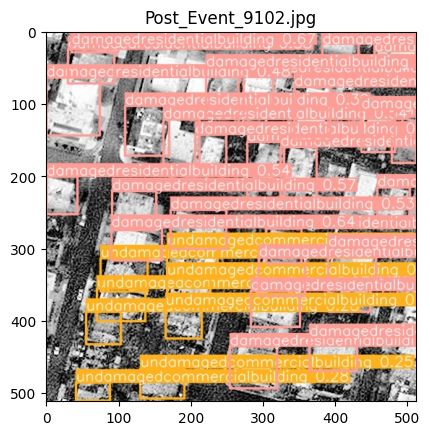

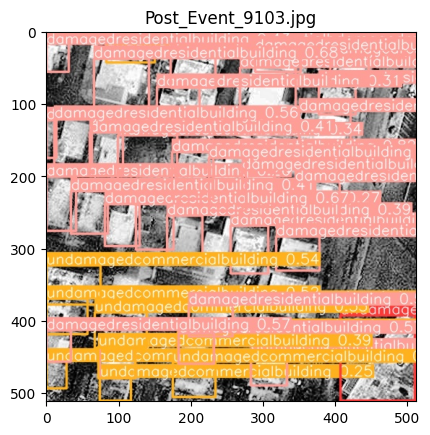

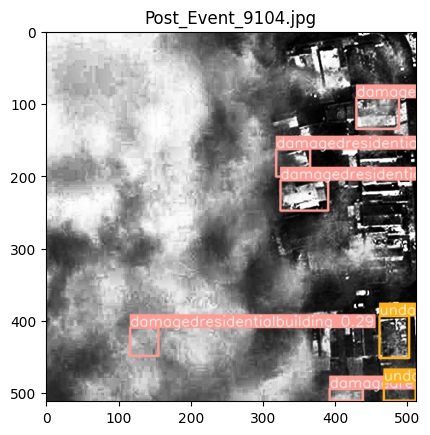

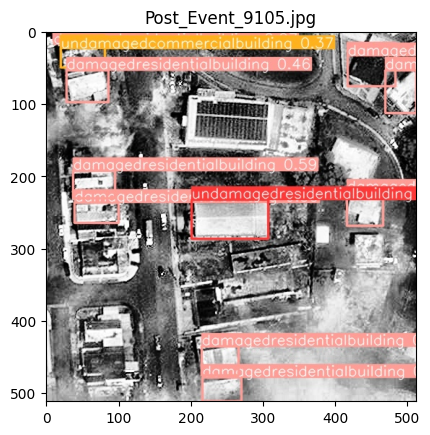

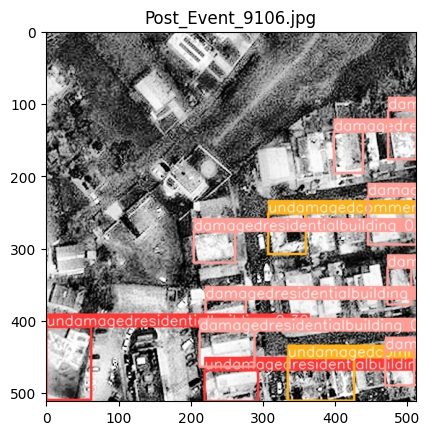

...

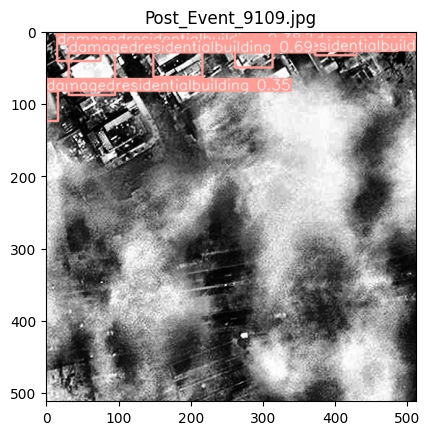

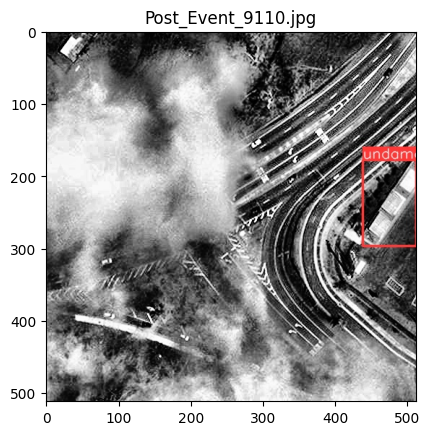

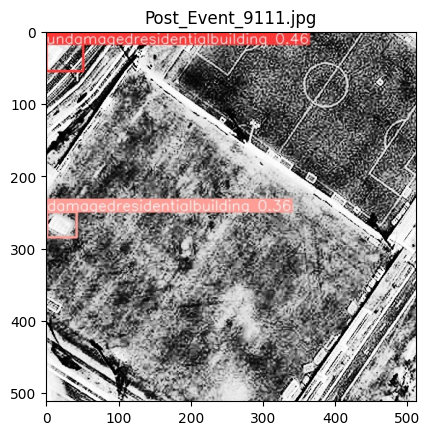

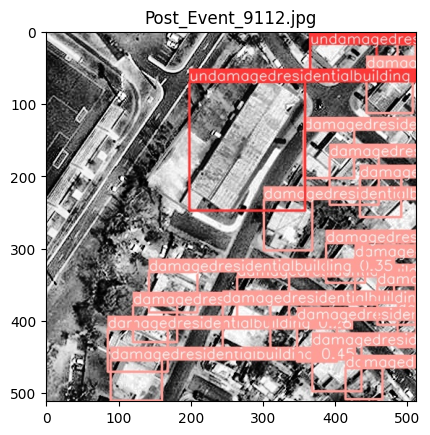

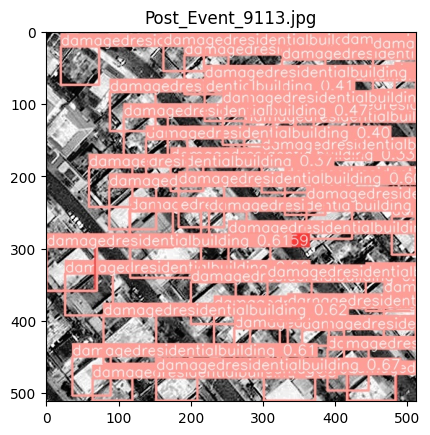

In [16]:
import os
import numpy as np
import matplotlib.pyplot as plt
import rasterio

# Path to the folder containing the images
folder_path = r'C:\Users\ronit\OneDrive\Documents\GitHub\structural-damage-assessment\runs\detect\predict2'

# List all files in the folder
image_files = [f for f in os.listdir(folder_path) if f.endswith(('jpg', 'jpeg', 'png', 'tif', 'tiff'))]

# Loop through each image file
for image_file in image_files:
    try:
        # Open the image file using rasterio
        with rasterio.open(os.path.join(folder_path, image_file)) as src:
            red = src.read(1)
            green = src.read(2)
            blue = src.read(3)

        # Combine bands into an RGB image
        img = np.dstack((red, green, blue))

        # Display the image
        plt.imshow(img)
        plt.title(image_file)  # Set title as image file name
        plt.show()
    except Exception as e:
        print(f"Error processing {image_file}: {e}")


Thank You